In [2]:
import cv2
import numpy as np
from google.colab import files
import matplotlib.pyplot as plt

In [3]:
uploaded = files.upload()

Saving BO1.jpeg to BO1.jpeg
Saving BO2.jpeg to BO2.jpeg
Saving BO3.jpeg to BO3.jpeg
Saving BO4.jpeg to BO4.jpeg
Saving BO5.jpeg to BO5.jpeg
Saving BO6.jpeg to BO6.jpeg
Saving BO7.jpeg to BO7.jpeg
Saving BO8.jpeg to BO8.jpeg
Saving BO9.jpeg to BO9.jpeg
Saving BO10.jpeg to BO10.jpeg
Saving IK1.jpeg to IK1.jpeg
Saving IK2.jpeg to IK2.jpeg
Saving IK3.jpeg to IK3.jpeg
Saving IK4.jpeg to IK4.jpeg
Saving IK5.jpeg to IK5.jpeg
Saving IK6.jpg to IK6.jpg
Saving IK7.jpeg to IK7.jpeg
Saving IK8.jpg to IK8.jpg
Saving IK9.jpg to IK9.jpg
Saving IK10.jpg to IK10.jpg
Saving KM1.jpeg to KM1.jpeg
Saving KM2.jpeg to KM2.jpeg
Saving KM3.jpeg to KM3.jpeg
Saving KM4.jpeg to KM4.jpeg
Saving KM5.jpeg to KM5.jpeg
Saving KM6.jpeg to KM6.jpeg
Saving KM7.jpeg to KM7.jpeg
Saving KM8.jpeg to KM8.jpeg
Saving KM9.jpeg to KM9.jpeg
Saving KM10.jpeg to KM10.jpeg
Saving RA1.jpeg to RA1.jpeg
Saving RA2.jpg to RA2.jpg
Saving RA3.jpeg to RA3.jpeg
Saving RA4.jpeg to RA4.jpeg
Saving RA5.jpeg to RA5.jpeg
Saving RA6.jpeg to RA6.j

In [4]:
data_dir = "/content/"

In [5]:
# List to store original and preprocessed images
original_images = []
preprocessed_images = []

In [6]:
processed_count = 0
max_images = 50  # Process only the first 50 images

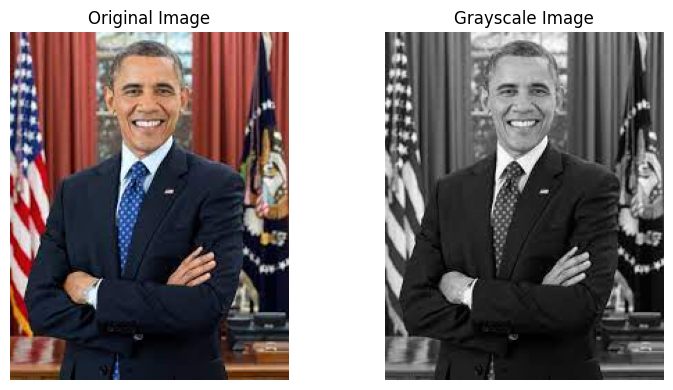

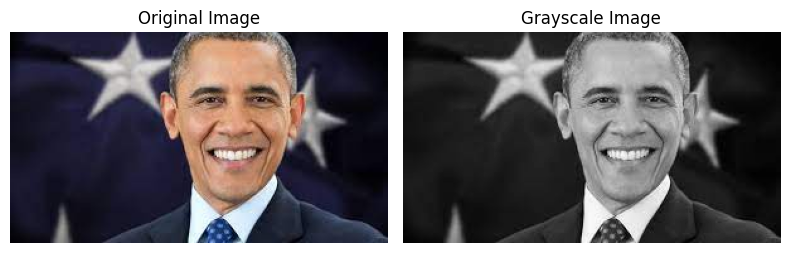

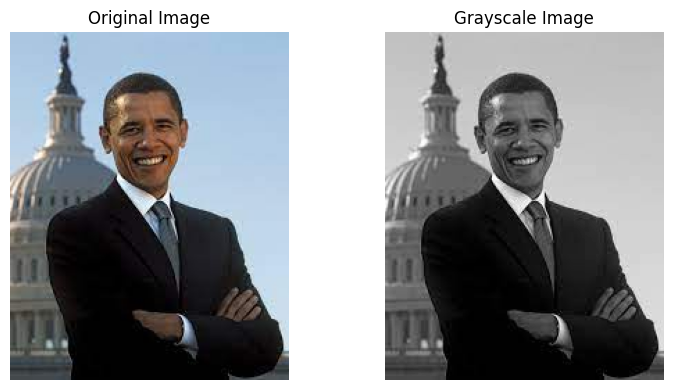

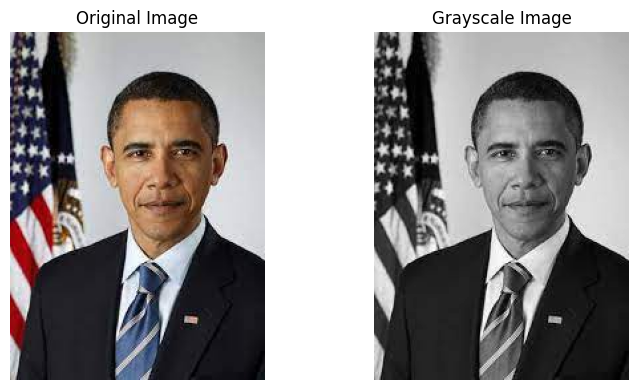

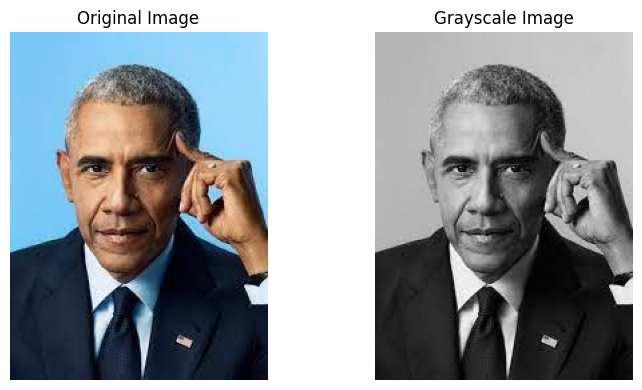

...

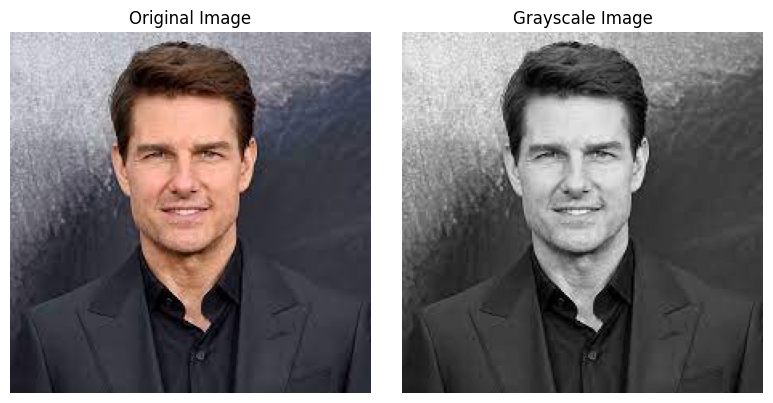

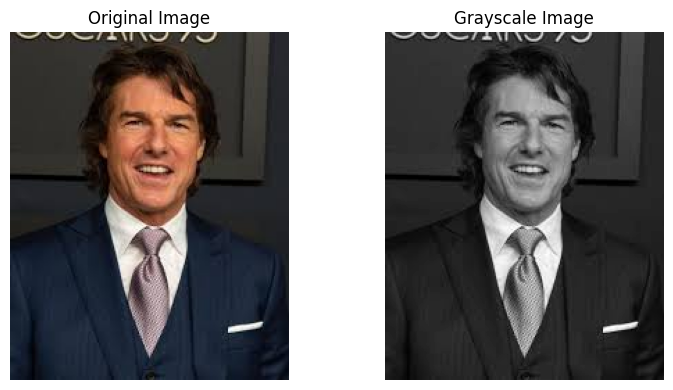

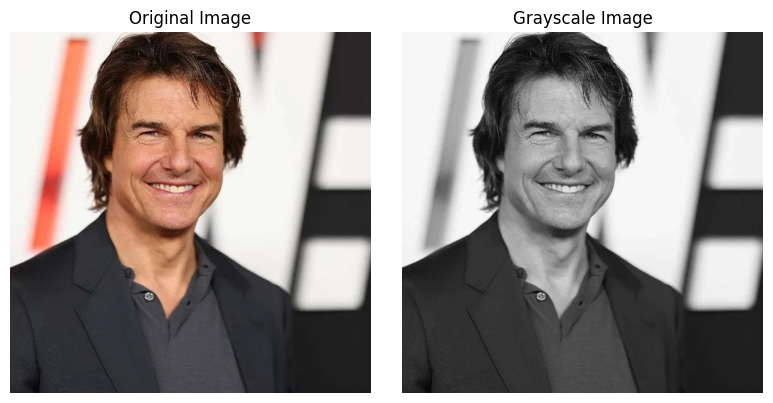

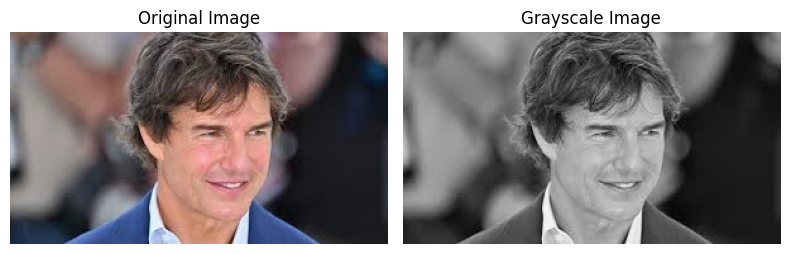

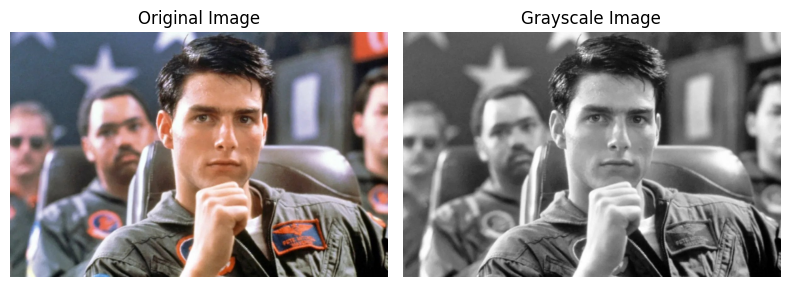

In [7]:
# Iterate through uploaded images
for filename in uploaded.keys():
    if processed_count >= max_images:
        break

    if filename.lower().endswith((".jpg", ".jpeg")):
        image_path = data_dir + filename
        # Read original image
        original = cv2.imread(image_path)
        original_images.append(original)

        # Convert to grayscale
        gray = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)
        preprocessed_images.append(gray)

        # Display original and grayscale images
        plt.figure(figsize=(8, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
        plt.title('Original Image')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(gray, cmap='gray')
        plt.title('Grayscale Image')
        plt.axis('off')

        plt.tight_layout()
        plt.show()

        processed_count += 1

In [17]:
import re
from sklearn.model_selection import train_test_split

# Assuming 'preprocessed_images' contain images
# Extract labels from filenames (assuming the pattern is consistent)
pattern = r'([A-Z]+)(\d+)'

# Extract labels from filenames and create a list of labels
labels = []
for filename in uploaded.keys():
    match = re.match(pattern, filename)
    if match:
        label = match.group(1)  # Extract the letters as the label (e.g., IK, KM, etc.)
        labels.append(label)

# Combine images and labels into a single list for convenience
data = list(zip(preprocessed_images, labels))

# Initialize empty lists to store training and testing data
train_data, test_data = [], []

# Split data into training and testing sets per label
for label in set(labels):
    label_images = [(img, lbl) for img, lbl in data if lbl == label]
    label_train, label_test = train_test_split(label_images, test_size=0.2)
    train_data.extend(label_train)
    test_data.extend(label_test)

# Split the training and testing data into images and corresponding labels
X_train, y_train = zip(*train_data)
X_test, y_test = zip(*test_data)


In [20]:
import cv2
from sklearn.decomposition import PCA

# Resize images in X_train and X_test
width, height = 100, 100  # Adjust according to your requirements

X_train_resized = [cv2.resize(img, (width, height)) for img in X_train]
X_test_resized = [cv2.resize(img, (width, height)) for img in X_test]

# Convert resized images to NumPy arrays
X_train_resized = np.array(X_train_resized)
X_test_resized = np.array(X_test_resized)

# Implement PCA on the resized training data
n_components = min(X_train_resized.shape[0], X_train_resized.shape[1])  # Adjust as needed
pca = PCA(n_components=n_components)
X_train_pca = pca.fit_transform(X_train_resized.reshape(len(X_train_resized), -1))
X_test_pca = pca.transform(X_test_resized.reshape(len(X_test_resized), -1))


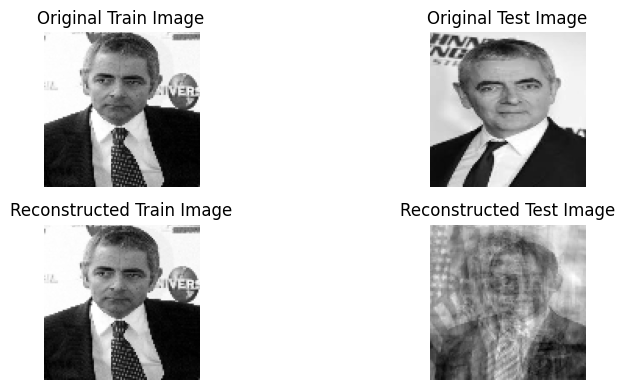

In [21]:
# Inverse transform PCA to reconstruct images
X_train_reconstructed = pca.inverse_transform(X_train_pca)
X_test_reconstructed = pca.inverse_transform(X_test_pca)

# Reshape the reconstructed images to their original dimensions
X_train_reconstructed = X_train_reconstructed.reshape(-1, width, height)
X_test_reconstructed = X_test_reconstructed.reshape(-1, width, height)

# Display original and reconstructed images
plt.figure(figsize=(10, 4))

# Original images
plt.subplot(2, 2, 1)
plt.imshow(X_train_resized[0], cmap='gray')
plt.title('Original Train Image')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(X_test_resized[0], cmap='gray')
plt.title('Original Test Image')
plt.axis('off')

# Reconstructed images after PCA
plt.subplot(2, 2, 3)
plt.imshow(X_train_reconstructed[0], cmap='gray')
plt.title('Reconstructed Train Image')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(X_test_reconstructed[0], cmap='gray')
plt.title('Reconstructed Test Image')
plt.axis('off')

plt.tight_layout()
plt.show()

In [22]:
from sklearn.neighbors import KNeighborsClassifier

# Initialize and train a KNN classifier
knn_classifier = KNeighborsClassifier(n_neighbors=3)  # Adjust the number of neighbors
knn_classifier.fit(X_train_pca, y_train)

# Predict using the trained classifier
y_pred = knn_classifier.predict(X_test_pca)

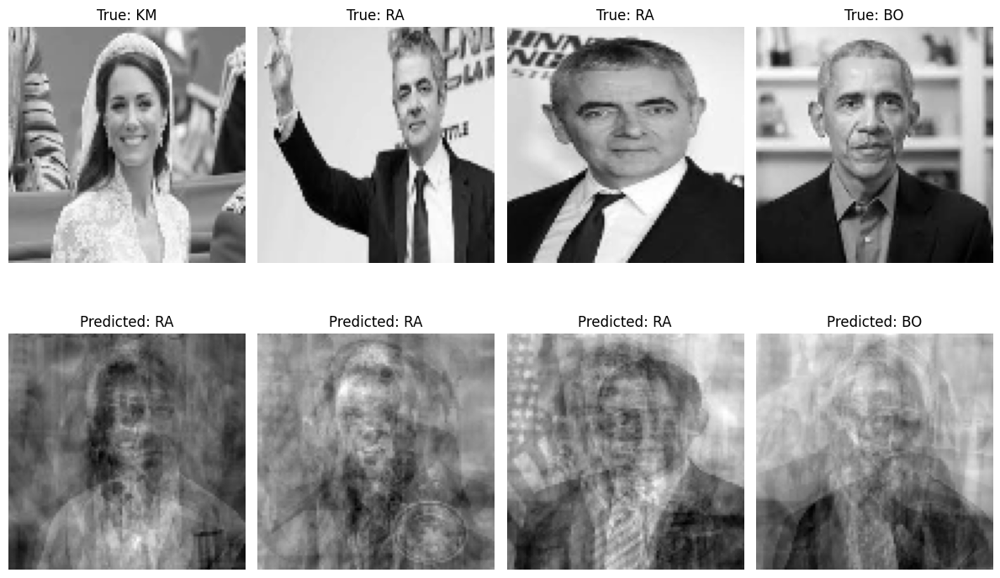

In [23]:
# Choose a few test samples to visualize
num_samples_to_visualize = 4  # Adjust as needed
sample_indices = np.random.choice(len(X_test_pca), num_samples_to_visualize, replace=False)

# Visualize the selected test samples with predictions
plt.figure(figsize=(12, 8))
for i, idx in enumerate(sample_indices):
    plt.subplot(2, num_samples_to_visualize, i + 1)
    plt.imshow(X_test_resized[idx], cmap='gray')
    plt.title(f"True: {y_test[idx]}")
    plt.axis('off')

    plt.subplot(2, num_samples_to_visualize, i + 1 + num_samples_to_visualize)
    plt.imshow(X_test_reconstructed[idx], cmap='gray')
    plt.title(f"Predicted: {y_pred[idx]}")
    plt.axis('off')

plt.tight_layout()
plt.show()


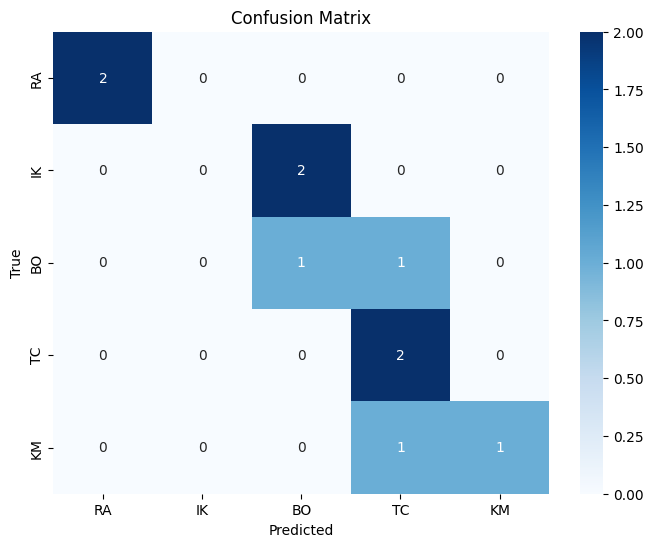

In [25]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Calculate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='d',
            xticklabels=set(y_test), yticklabels=set(y_test))
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [24]:
from sklearn.metrics import accuracy_score, classification_report

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

# Generate a classification report
report = classification_report(y_test, y_pred)
print(f"Classification Report:\n{report}")

Accuracy: 0.6
Classification Report:
              precision    recall  f1-score   support

          BO       1.00      1.00      1.00         2
          IK       0.00      0.00      0.00         2
          KM       0.33      0.50      0.40         2
          RA       0.50      1.00      0.67         2
          TC       1.00      0.50      0.67         2

    accuracy                           0.60        10
   macro avg       0.57      0.60      0.55        10
weighted avg       0.57      0.60      0.55        10



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
